### Student Information
Name: 楊博惟

Student ID: 109062519

GitHub ID: willy142857

---

### Instructions

1. First: do the **take home** exercises in the [DM2020-Lab1-Master Repo](https://github.com/fhcalderon87/DM2020-Lab1-Master). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2020-Lab1-Master Repo](https://github.com/fhcalderon87/DM2020-Lab1-Master) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://archive.ics.uci.edu/ml/datasets/Sentiment+Labelled+Sentences#). The dataset contains a `sentence` and `score` label. Read the specificiations of the dataset for details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be habdled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy :'(, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/fhcalderon87/DM2020-Lab1-Master/blob/master/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (Oct. 22th 11:59 pm, Thursday)__. 

# 1. Take Home Exercises

In [1]:
# necessary for when working with external scripts
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_20newsgroups

import helpers.data_mining_helpers as dmh


# categories
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']
twenty_train = fetch_20newsgroups(subset='train', categories=categories, shuffle=True, random_state=42)

X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])
X['category'] = twenty_train.target
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

### ** >>> Exercise 2 (take home):** 
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [3]:
# query from a specific category
# use @ refer to variables
X.query('category_name==@categories[1]')

,text,category,category_name
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
...,...,...,...
2229,From: jcj@tellabs.com (jcj) Subject: Re: proof...,3,soc.religion.christian
2230,From: news@cbnewsk.att.com Subject: Re: Bible ...,3,soc.religion.christian
2246,From: lmvec@westminster.ac.uk (William Hargrea...,3,soc.religion.christian
2247,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian


In [4]:
# query records which contain 'ufl.edu' or '.ac.uk'
X[X['text'].str.contains('.ufl.edu|.ac.uk')]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
24,From: mjw19@cl.cam.ac.uk (M.J. Williams) Subje...,1,comp.graphics
47,From: fraseraj@dcs.glasgow.ac.uk (Andrew J Fra...,3,soc.religion.christian
50,From: ab@nova.cc.purdue.edu (Allen B) Subject:...,1,comp.graphics
57,From: mauaf@csv.warwick.ac.uk (Mr P D Simmons)...,3,soc.religion.christian
...,...,...,...
2185,From: freemant@dcs.glasgow.ac.uk (Toby Freeman...,1,comp.graphics
2222,From: hayesstw@risc1.unisa.ac.za (Steve Hayes)...,3,soc.religion.christian
2246,From: lmvec@westminster.ac.uk (William Hargrea...,3,soc.religion.christian
2247,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian


In [5]:
X.loc[::100, ['text', 'category_name']]

,text,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,comp.graphics
100,From: mathew <mathew@mantis.co.uk> Subject: Re...,alt.atheism
200,From: johnsd2@rpi.edu (Dan Johnson) Subject: R...,soc.religion.christian
300,Subject: Re: Yet more Rushdie [Re: ISLAMIC LAW...,alt.atheism
400,From: nfotis@ntua.gr (Nick C. Fotis) Subject: ...,comp.graphics
500,From: qpliu@phoenix.Princeton.EDU (q.p.liu) Su...,alt.atheism
600,"From: ""Robert Knowles"" <p00261@psilink.com> Su...",alt.atheism
700,From: jaeger@buphy.bu.edu (Gregg Jaeger) Subje...,alt.atheism
800,From: JJMARVIN@pucc.princeton.edu Subject: pra...,soc.religion.christian
900,From: pes@hutcs.cs.hut.fi (Pekka Siltanen) Sub...,comp.graphics


### >>> **Exercise 5 (take home)** 
There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [3]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [7]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

### Answer
* Id B and C are "string" types, containing 'NAN' and 'None' respectively. They are NOT null.
* Id F is an empty string. In pandas, an empty string is NOT null. 

### >>> Exercise 6 (take home):
Notice any changes to the `X` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

In [3]:
X_sample = X.sample(n=1000) #random state
X_sample.head()

,text,category,category_name
1015,From: orourke@sophia.smith.edu (Joseph O'Rourk...,1,comp.graphics
1334,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
304,From: mart4678@mach1.wlu.ca (Phil Martin u) Su...,1,comp.graphics
950,From: moy@acf2.nyu.edu (moy) Subject: Apology ...,3,soc.religion.christian
956,From: dfuller@portal.hq.videocart.com (Dave Fu...,0,alt.atheism


In [4]:
X.head()

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian


In [5]:
X_resample = X.sample(n=1000)
X_resample.head()

,text,category,category_name
910,From: omar@godzilla.osf.org (Mark Marino) Subj...,1,comp.graphics
1617,From: I3150101@dbstu1.rz.tu-bs.de (Benedikt Ro...,0,alt.atheism
1879,From: randerso@acad1.sahs.uth.tmc.edu (Robert ...,3,soc.religion.christian
1557,From: lm001@rrz.Uni-Koeln.DE (Erwin H. Keeve) ...,1,comp.graphics
1187,From: noye@midway.uchicago.edu (vera shanti no...,3,soc.religion.christian


### Answer
As for differences between X and X_sample, we can see the order of documents are random. Also, sampled documents will be different every time.

### >>> **Exercise 8 (take home):** 
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

![alt txt](https://i.imgur.com/9eO431H.png)

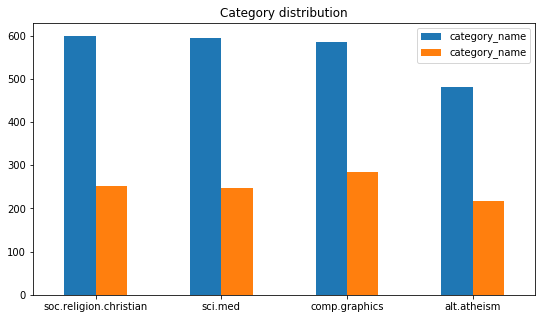

In [16]:
xtricks = np.arange(4)
data = X['category_name'].value_counts()
sample_data = X_sample['category_name'].value_counts()
pd.concat([data, sample_data], axis=1).plot(kind='bar', title='Category distribution', rot=0, figsize=(9, 5))

### **>>> Exercise 10 (take home):**
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [6]:
import nltk
from sklearn.feature_extraction.text import CountVectorizer


X['unigrams'] = X['text'].apply(lambda x: dmh.tokenize_text(x))

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text)

In [7]:
X_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [8]:
temp = X_counts[:5, :100]
rows, cols = temp.nonzero()

corpus = count_vect.get_feature_names()
doc_terms = [corpus[c] for c in cols]
doc_terms

['00', '01']

The first `1` means `00` term and the second `1` means `01` term.

### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with frequency of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

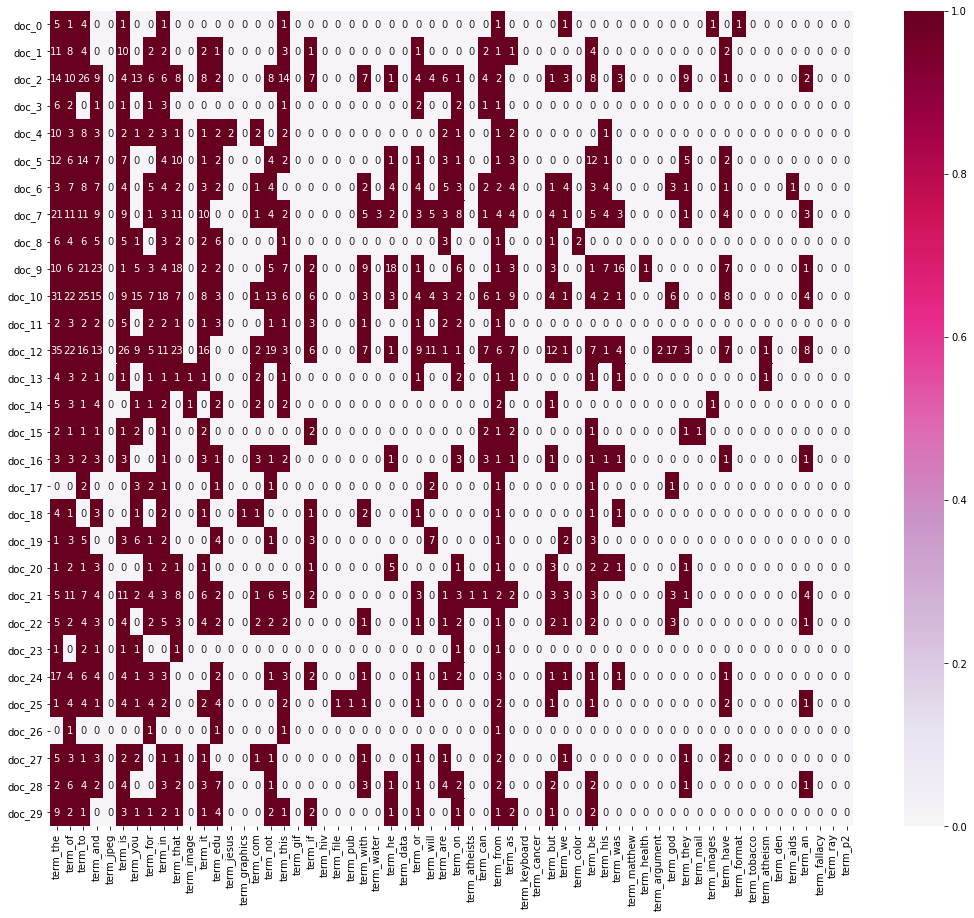

In [17]:
import seaborn as sns

sampled_feat_names = np.array(count_vect.get_feature_names())
plot_x = ["term_"+str(i) for i in sampled_feat_names]
# obtain document index
sampled_docs = X.index
plot_y = ["doc_"+ str(i) for i in list(sampled_docs)]
plot_z = X_counts.toarray()

df_todraw = pd.DataFrame(plot_z, columns=plot_x, index=plot_y)
df_todraw = df_todraw[df_todraw.max().sort_values(ascending=False).index] # sort terms by frequency
df_todraw = df_todraw.iloc[:30,:60]
plt.subplots(figsize=(18, 15))
ax = sns.heatmap(df_todraw, cmap="PuRd", vmin=0, vmax=1, annot=True)
plt.show()

The matrix is really sparse, so I sort the dataframe to create the meaningful heatmap.

### >>> Exercise 12 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

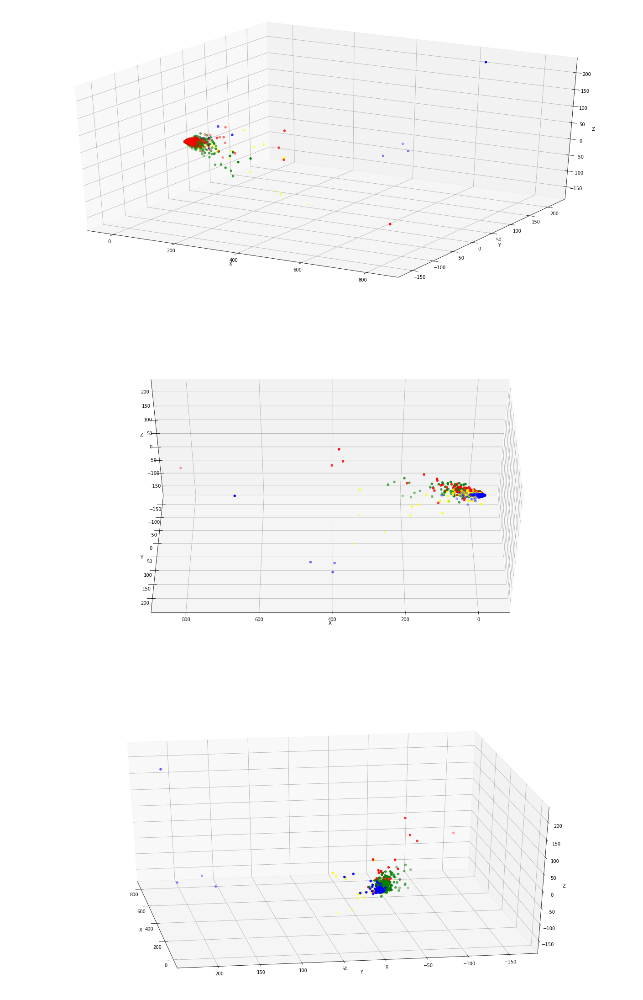

In [10]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

X_reduced = PCA(n_components=3).fit_transform(X_counts.toarray())

fig = plt.figure(figsize=(25, 40))

def plot3d(ax, elev=None, azim=None):
    colors = ['red', 'green', 'blue', 'yellow'] # colors for 4 categories
    for color, category in zip(colors, categories):
        xs = X_reduced[X['category_name']==category, 0]
        ys = X_reduced[X['category_name']==category, 1]         
        zs = X_reduced[X['category_name']==category, 2]         
        ax.scatter(xs, ys, zs, c=color, marker='o')

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.view_init(elev, azim)

# 3 different angle
ax1 = fig.add_subplot(311, projection='3d')
plot3d(ax1)
ax2 = fig.add_subplot(312, projection='3d')
plot3d(ax2, 45, 90)
ax3 = fig.add_subplot(313, projection='3d')
plot3d(ax3, None, 171)

### >>> **Exercise 13 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [9]:
# inefficent!!!
# term_frequencies = []
# for j in range(0,X_counts.shape[1]):
#     term_frequencies.append(sum(X_counts[:,j].toarray()))
# term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

term_frequencies = np.asarray(X_counts.sum(axis=0)).flatten()

#### show 300 terms

In [18]:
import plotly.express as px


freq_term_df = pd.DataFrame({'frequency': term_frequencies, 'term': count_vect.get_feature_names()})
fig = px.bar(freq_term_df[6000:6300], x='term', y='frequency')
fig.show()

### >>> **Exercise 14 (take home):** 
The chart above contains all the vocabulary, and it's computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 


In [19]:
from nltk.corpus import stopwords
nltk.download('stopwords')


# Stop words are not meaningful(e.g. the, a, of). Just remove them! 
english_stopwords = set(stopwords.words('english'))
selected_terms_idx = []
for i, term in enumerate(count_vect.get_feature_names()):
    if term not in english_stopwords:
        selected_terms_idx.append(i)

# show terms which appear beteween 50 and 100 times
selected_terms_idx = [i for i in selected_terms_idx if term_frequencies[i] >= 50 and term_frequencies[i] <= 100]

selected_freq_term_df = pd.DataFrame({'frequency': term_frequencies[selected_terms_idx], 
                                      'term': np.array(count_vect.get_feature_names())[selected_terms_idx]
                                     })
fig = px.bar(selected_freq_term_df, x='term', y='frequency')
fig.show()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\willy\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### >>> **Exercise 15 (take home):** 
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

[]

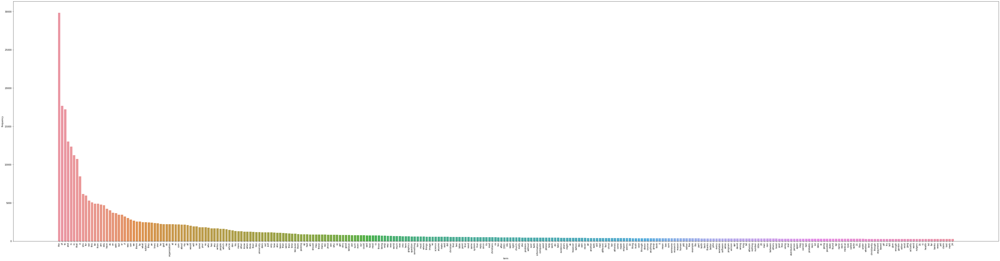

In [20]:
freq_term_df = pd.DataFrame({'frequency': term_frequencies, 
                             'term': np.array(count_vect.get_feature_names())
                            })
sorted_data = freq_term_df.sort_values(by=['frequency'], ascending=False)

plt.subplots(figsize=(80, 20))
g = sns.barplot(x=sorted_data['term'][:300], 
            y=sorted_data['frequency'][:300])
g.set_xticklabels(sorted_data['term'][:300], rotation=90)
g.plot()

### >>> **Exercise 16 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [21]:
from sklearn import preprocessing

lb = preprocessing.LabelBinarizer()
X['bin_category_name'] = lb.fit_transform(X['category_name']).tolist()
X

,text,category,category_name,unigrams,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...","[0, 0, 0, 1]"
...,...,...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med,"[From, :, roos, @, Operoni.Helsinki.FI, (, Chr...","[0, 0, 1, 0]"
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med,"[From, :, mhollowa, @, ic.sunysb.edu, (, Micha...","[0, 0, 1, 0]"
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med,"[From, :, sasghm, @, theseus.unx.sas.com, (, G...","[0, 0, 1, 0]"
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med,"[From, :, Dan, Wallach, <, dwallach, @, cs.ber...","[0, 0, 1, 0]"


It works.

# 2.
## Table of Contents
1. Data Source
2. Data Preparation
3. Data Transformation
4. Data Mining using Pandas
    * 4.1 Dealing with Missing Values
    * 4.2 Dealing with Duplicate Data
5. Data Preprocessing
    * 5.1 Sampling
    * 5.2 Feature Creation
    * 5.3 Feature Subset Selection
    * 5.4 Dimensionality Reduction
    * 5.5 Atrribute Transformation / Aggregation
    * 5.6 Discretization and Binarization
6. Data Exploration

### 1. Data Source
This dataset contains sentences labelled with positive or negative **sentiments**. There are there files in the ./dataset folder.
* amazon_cells_labelled.txt
* imdb_labelled.txt
* yelp_labelled.txt

### 2. Data Preparation

In [22]:
import csv
import os
from os import path


data_dir = 'dataset'
cols_name = ['sentence', 'score']
amazon_df = pd.read_table(path.join(data_dir, 'amazon_cells_labelled.txt'), sep='\t', names=cols_name)
# some sentences have an unpaired double quote(")
imdb_df = pd.read_table(path.join(data_dir, 'imdb_labelled.txt'), sep='\t', names=cols_name, quoting=csv.QUOTE_NONE) 
yelp_df = pd.read_table(path.join(data_dir, 'yelp_labelled.txt'), sep='\t', names=cols_name)

In [23]:
amazon_df

,sentence,score
0,So there is no way for me to plug it in here i...,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more...,0
4,The mic is great.,1
...,...,...
995,The screen does get smudged easily because it ...,0
996,What a piece of junk.. I lose more calls on th...,0
997,Item Does Not Match Picture.,0
998,The only thing that disappoint me is the infra...,0


In [24]:
imdb_df

,sentence,score
0,"A very, very, very slow-moving, aimless movie ...",0
1,Not sure who was more lost - the flat characte...,0
2,Attempting artiness with black & white and cle...,0
3,Very little music or anything to speak of.,0
4,The best scene in the movie was when Gerardo i...,1
...,...,...
995,I just got bored watching Jessice Lange take h...,0
996,"Unfortunately, any virtue in this film's produ...",0
997,"In a word, it is embarrassing.",0
998,Exceptionally bad!,0


In [25]:
yelp_df

,sentence,score
0,Wow... Loved this place.,1
1,Crust is not good.,0
2,Not tasty and the texture was just nasty.,0
3,Stopped by during the late May bank holiday of...,1
4,The selection on the menu was great and so wer...,1
...,...,...
995,I think food should have flavor and texture an...,0
996,Appetite instantly gone.,0
997,Overall I was not impressed and would not go b...,0
998,"The whole experience was underwhelming, and I ...",0


### 3. Data Transformation
combine the datasets all together

In [23]:
amazon_df['src'] = 'amazon'
imdb_df['src'] = 'imdb'
yelp_df['src'] = 'yelp'

all_df = pd.concat([amazon_df, imdb_df, yelp_df], ignore_index=True)
all_df

,sentence,score,src
0,So there is no way for me to plug it in here i...,0,amazon
1,"Good case, Excellent value.",1,amazon
2,Great for the jawbone.,1,amazon
3,Tied to charger for conversations lasting more...,0,amazon
4,The mic is great.,1,amazon
...,...,...,...
2995,I think food should have flavor and texture an...,0,yelp
2996,Appetite instantly gone.,0,yelp
2997,Overall I was not impressed and would not go b...,0,yelp
2998,"The whole experience was underwhelming, and I ...",0,yelp


### 4. Data Mining using Panda

#### 4.1 Dealing with Missing Values

In [27]:
# checking missing values
all_df.isnull().apply(lambda x: dmh.check_missing_values(x))

sentence    (The amoung of missing records is: , 0)
score       (The amoung of missing records is: , 0)
src         (The amoung of missing records is: , 0)
dtype: object

#### 4.2 Dealing with duplicate data

In [28]:
# checking duplicated data
all_df[all_df.duplicated()]

,sentence,score,src
285,Great phone!.,1,amazon
407,Works great.,1,amazon
524,Works great!.,1,amazon
543,Don't buy this product.,0,amazon
744,If you like a loud buzzing to override all you...,0,amazon
748,Does not fit.,0,amazon
778,This is a great deal.,1,amazon
792,Great Phone.,1,amazon
892,Excellent product for the price.,1,amazon
896,Great phone.,1,amazon


In [24]:
all_df = all_df.drop_duplicates(keep='first').reset_index()
all_df['src'].value_counts()

imdb      997
yelp      996
amazon    990
Name: src, dtype: int64

### 5.1 Data Preprocessing

#### 5.1 Sampling

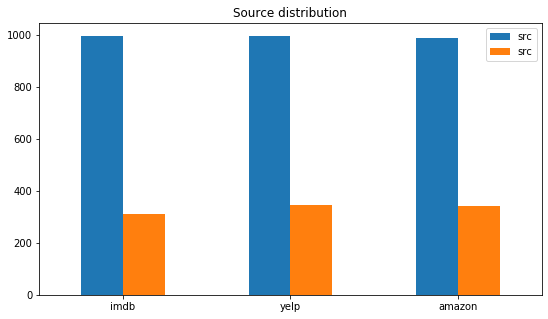

In [25]:
sampled_df = all_df.sample(1000)
tricks = np.arange(3)
data = all_df['src'].value_counts()
sample_data = sampled_df['src'].value_counts()
pd.concat([data, sample_data], axis=1).plot(kind='bar', title='Source distribution', rot=0, figsize=(9, 5))

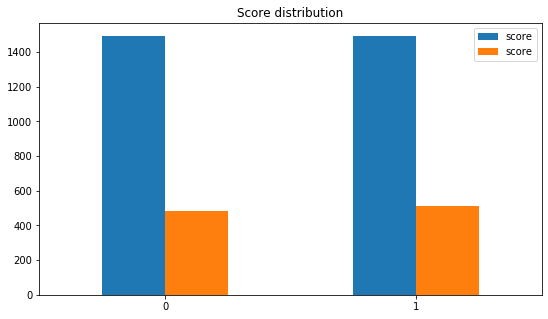

In [40]:
data = all_df['score'].value_counts()
sample_data = sampled_df['score'].value_counts()
pd.concat([data, sample_data], axis=1).plot(kind='bar', title='Score distribution', rot=0, figsize=(9, 5))

#### 5.2 Feature Creation

In [26]:
# add filtering stop words to helper function
all_df['unigrams'] = all_df['sentence'].apply(lambda x: dmh.tokenize_text(x))

all_df

,index,sentence,score,src,unigrams
0,0,So there is no way for me to plug it in here i...,0,amazon,"[So, way, plug, US, unless, I, go, converter, .]"
1,1,"Good case, Excellent value.",1,amazon,"[Good, case, ,, Excellent, value, .]"
2,2,Great for the jawbone.,1,amazon,"[Great, jawbone, .]"
3,3,Tied to charger for conversations lasting more...,0,amazon,"[Tied, charger, conversations, lasting, 45, mi..."
4,4,The mic is great.,1,amazon,"[The, mic, great, .]"
...,...,...,...,...,...
2978,2995,I think food should have flavor and texture an...,0,yelp,"[I, think, food, flavor, texture, lacking, .]"
2979,2996,Appetite instantly gone.,0,yelp,"[Appetite, instantly, gone, .]"
2980,2997,Overall I was not impressed and would not go b...,0,yelp,"[Overall, I, impressed, would, go, back, .]"
2981,2998,"The whole experience was underwhelming, and I ...",0,yelp,"[The, whole, experience, underwhelming, ,, I, ..."


#### 5.3 Feature subset selection

In [27]:
count_vectorizer = CountVectorizer(stop_words='english')
doc_term = count_vectorizer.fit_transform(all_df['sentence'])
print(doc_term.shape)
count_vectorizer.get_feature_names()[:10]

(2983, 4896)


['00', '10', '100', '11', '12', '13', '15', '15g', '15pm', '17']

#### 5.4 Dimensionality Reduction

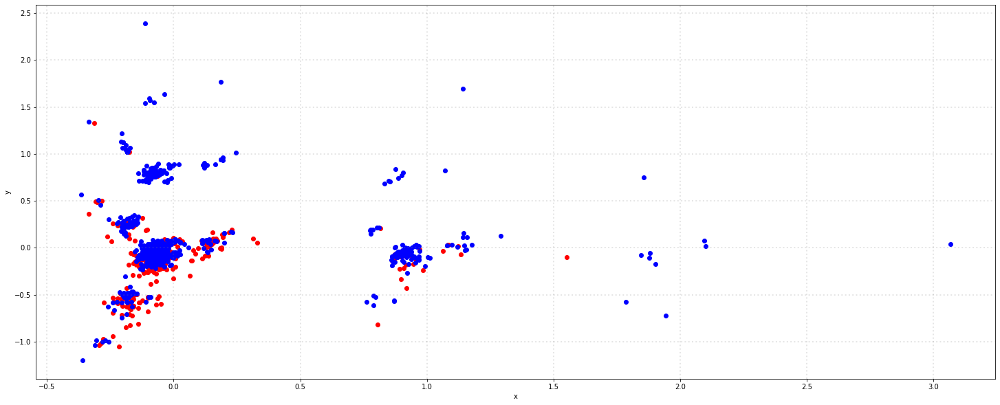

In [38]:
from sklearn.decomposition import PCA
# reduce all datasets to 2 dimensions and plot their values
all_reduced = PCA(n_components=2).fit_transform(doc_term.toarray())

# plot
fig = plt.figure(figsize = (25, 10))
ax = fig.subplots()

colors = ['red', 'blue']
for label, color, in enumerate(colors):
    xs = all_reduced[all_df['score'] == label].T[0]
    ys = all_reduced[all_df['score'] == label].T[1]
   
    ax.scatter(xs, ys, c=color, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('x')
ax.set_ylabel('y')

plt.show()

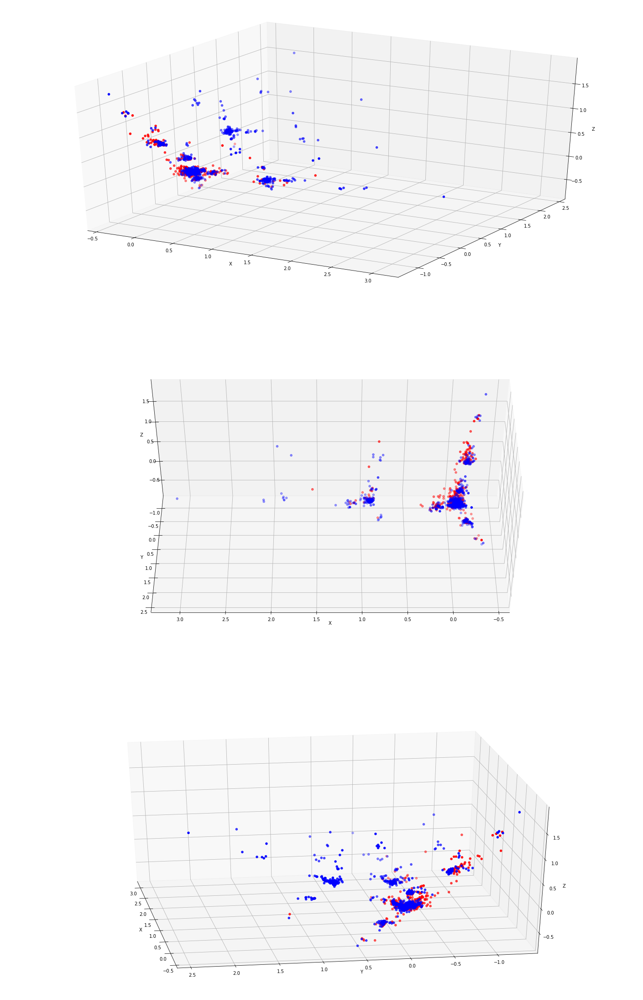

In [45]:
all_reduced = PCA(n_components=3).fit_transform(doc_term.toarray())

fig = plt.figure(figsize=(25, 40))

def plot3d(ax, elev=None, azim=None):
    colors = ['red', 'blue']
    for label, color in enumerate(colors):
        xs = all_reduced[all_df['score']==label, 0]
        ys = all_reduced[all_df['score']==label, 1]         
        zs = all_reduced[all_df['score']==label, 2]         
        ax.scatter(xs, ys, zs, c=color, marker='o')

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.view_init(elev, azim)

# 3 different angle
ax1 = fig.add_subplot(311, projection='3d')
plot3d(ax1)
ax2 = fig.add_subplot(312, projection='3d')
plot3d(ax2, 45, 90)
ax3 = fig.add_subplot(313, projection='3d')
plot3d(ax3, None, 171)

Data points with positive/negative sentiments does not be in different areas of the plot, so it might not be a good idea to train a classifier by using this.

#### 5.5 Atrribute Transformation / Aggregation
top 20 words

['good', 'great', 'movie', 'phone', 'film', 'food', 'like', 'just', 'time', 'place', 'service', 'bad', 'really', 'don', 'best', 'quality', 've', 'love', 'work', 'product']


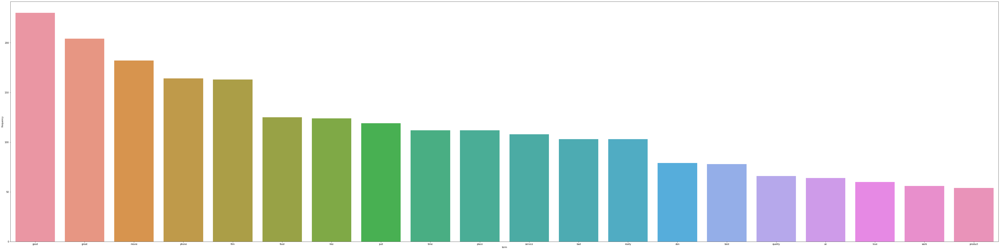

In [35]:
term_frequencies = np.asarray(doc_term.sum(axis=0)).flatten()

freq_term_df = pd.DataFrame({'frequency': term_frequencies, 
                             'term': np.array(count_vectorizer.get_feature_names())
                            })
sorted_data = freq_term_df.sort_values(by=['frequency'], ascending=False)

print(list(sorted_data['term'][:20]))

plt.subplots(figsize=(80, 20))
# g.set_xticklabels(count_vect.get_feature_names()[:100], rotation=90)
g = sns.barplot(x=sorted_data['term'][:20], 
            y=sorted_data['frequency'][:20])


#### 5.6 Discretization and Binarization
The original label is only 0 and 1. It's already discretized and binarized.

### 6. Data Exploration
show what words are frequently used in positive and negative sentiment sentences.

In [36]:
def get_top_k_terms(src, label, top_k):
    tf = np.asarray(doc_term[all_df.query("score == @label & src == @src").index].sum(axis=0)).flatten()
    rank_idx = np.argsort(tf)[::-1]
    return np.asarray(count_vectorizer.get_feature_names())[rank_idx[:top_k]]


print(f"Top 10 positive terms of amazon: {get_top_k_terms('amazon', 1, 10)}")
print(f"Top 10 positive terms of imdb: {get_top_k_terms('imdb', 1, 10)}")
print(f"Top 10 positive terms of yelp: {get_top_k_terms('yelp', 1, 10)}")

Top 10 positive terms of amazon: ['great' 'phone' 'good' 'works' 'product' 'headset' 'quality' 'sound'
 'excellent' 'price']
Top 10 positive terms of imdb: ['film' 'movie' 'good' 'great' 'characters' 'just' 'like' '10' 'best'
 'love']
Top 10 positive terms of yelp: ['good' 'great' 'food' 'place' 'service' 'friendly' 'delicious' 'best'
 'really' 'time']


In [37]:
print(f"Top 10 negative terms of amazon: {get_top_k_terms('amazon', 0, 10)}")
print(f"Top 10 negative terms of imdb: {get_top_k_terms('imdb', 0, 10)}")
print(f"Top 10 negative terms of yelp: {get_top_k_terms('yelp', 0, 10)}")

Top 10 negative terms of amazon: ['phone' 'work' 'battery' 'don' 'product' 'use' 'ear' 'quality' 'does'
 'money']
Top 10 negative terms of imdb: ['movie' 'bad' 'film' 'just' 'like' 'acting' 'time' 'plot' 'really'
 'script']
Top 10 negative terms of yelp: ['food' 'place' 'service' 'like' 'don' 'good' 'time' 'minutes' 'bad'
 'just']


# 3.

#### New Data Visualizations
use wordcloud to visualize most common terms in dataset

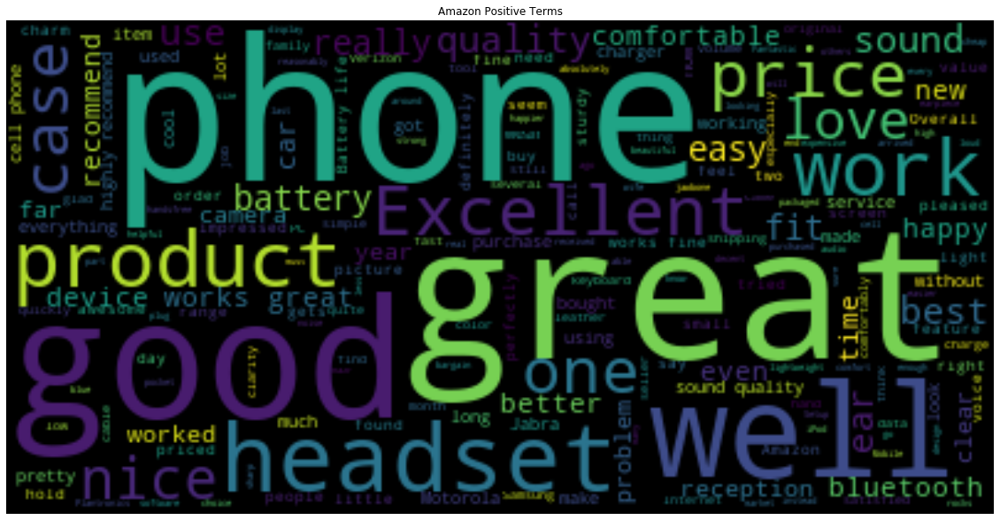

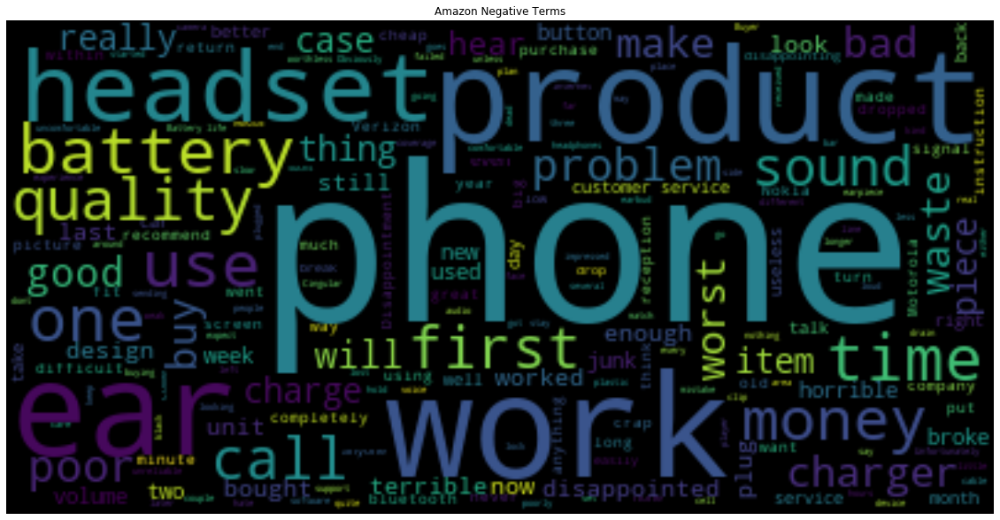

In [38]:
from wordcloud import WordCloud

def plot_wordcloud(text, title):
    # Create and generate a word cloud image:
    wordcloud = WordCloud().generate(text)
    # Display the generated image:
    plt.figure(figsize=(20, 15))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis("off")
    plt.show()

plot_wordcloud(' '.join(all_df.query("score == 1 & src == 'amazon'")['sentence']), 'Amazon Positive Terms')
plot_wordcloud(' '.join(all_df.query("score == 0 & src == 'amazon'")['sentence']), 'Amazon Negative Terms')

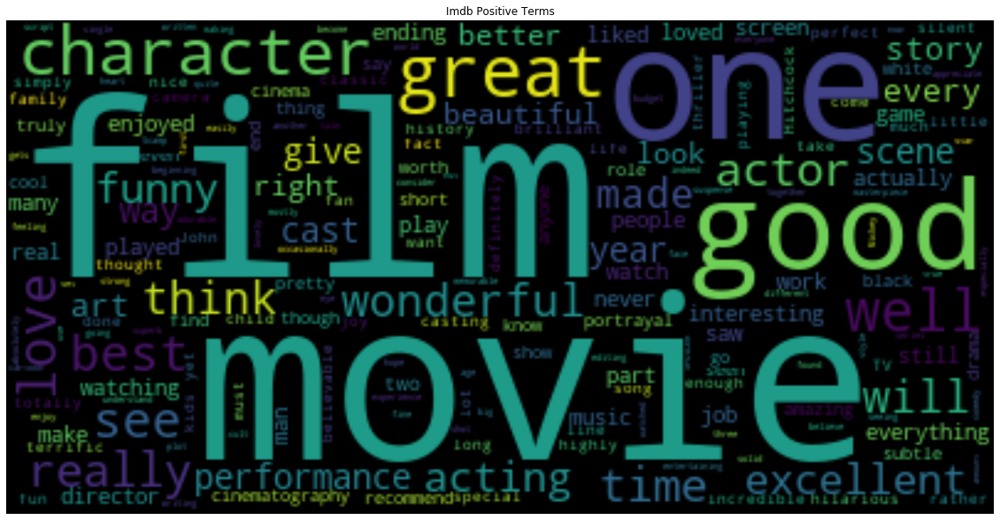

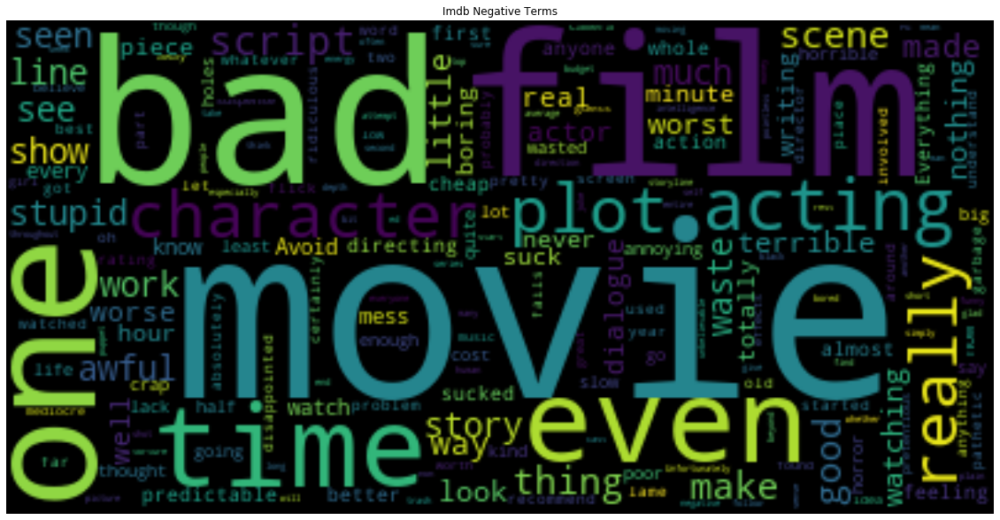

In [39]:
plot_wordcloud(' '.join(all_df.query("score == 1 & src == 'imdb'")['sentence']), 'Imdb Positive Terms')
plot_wordcloud(' '.join(all_df.query("score == 0 & src == 'imdb'")['sentence']), 'Imdb Negative Terms')

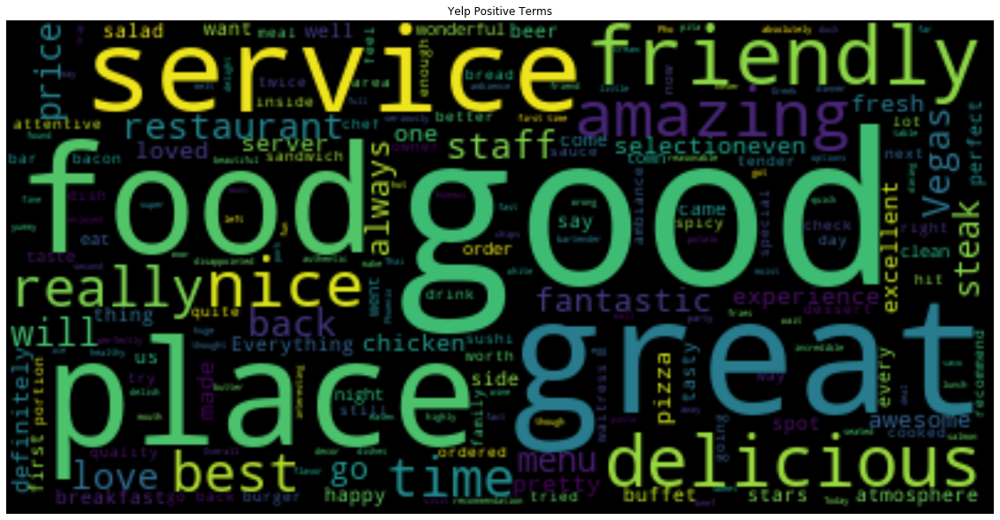

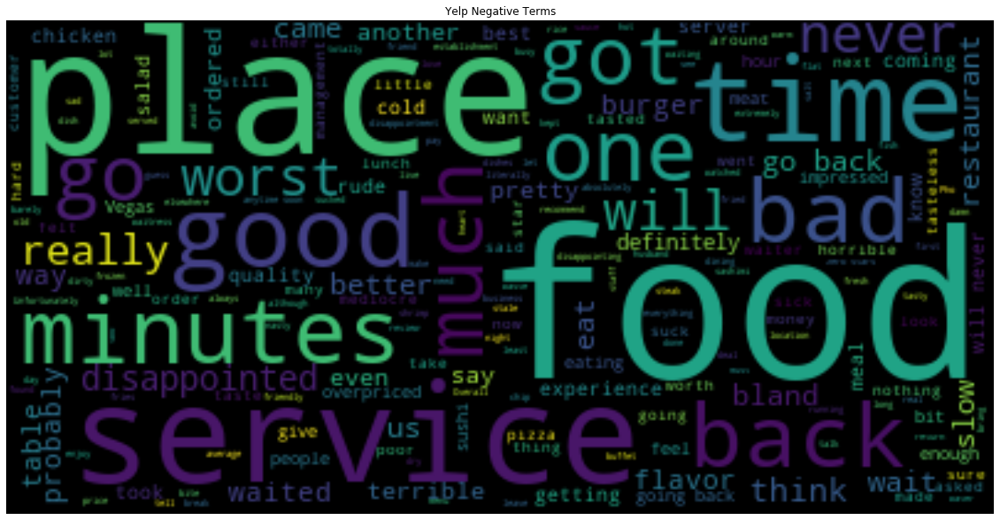

In [40]:
plot_wordcloud(' '.join(all_df.query("score == 1 & src == 'yelp'")['sentence']), 'Yelp Positive Terms')
plot_wordcloud(' '.join(all_df.query("score == 0 & src == 'yelp'")['sentence']), 'Yelp Negative Terms')

#### Tf-idf

In [34]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB

tfidf_vectorizer = TfidfVectorizer(sublinear_tf=True, stop_words='english')
doc_term_tfidf = tfidf_vectorizer.fit_transform(all_df['sentence']).toarray()

#### Naive Bayes classifier
According to the provided reference, Multinomial naive Bayes is useful to model feature vectors where each value represents, for example, the number of occurrences of a term or its relative frequency. So here I use it to classify

#### Without tf-idf

In [35]:
def count_acc(X, Y):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=5568)
    bn = MultinomialNB()
    bn.fit(X_train, Y_train)
    return bn.score(X_test, Y_test)

print(f"amazon acc: {count_acc(doc_term[:997], all_df.loc[:996, 'score'])}")
print(f"imdb acc: {count_acc(doc_term[997:1993], all_df.loc[997:1992, 'score'])}")
print(f"yelp acc: {count_acc(doc_term[1993:], all_df.loc[1993:, 'score'])}")
print(f"all dataset acc: {count_acc(doc_term, all_df['score'])}")

amazon acc: 0.79
imdb acc: 0.815
yelp acc: 0.7676767676767676
all dataset acc: 0.8207705192629816


#### With tf-idf

In [36]:
print(f"amazon acc: {count_acc(doc_term_tfidf[:997], all_df.loc[:996, 'score'])}")
print(f"imdb acc: {count_acc(doc_term_tfidf[997:1993], all_df.loc[997:1992, 'score'])}")
print(f"yelp acc: {count_acc(doc_term_tfidf[1993:], all_df.loc[1993:, 'score'])}")
print(f"all dataset acc: {count_acc(doc_term_tfidf, all_df['score'])}")

amazon acc: 0.8
imdb acc: 0.795
yelp acc: 0.7878787878787878
all dataset acc: 0.8257956448911222


For the result above, we get a little bit better performace with tfidf features. Tf-idf works well at informational retrieval because it can compute how similar the two documents are by cosine similarity. However, it may not really helpful with naive bayes classifier in this task.

### 4.
In the lab part, stop words and punctuations are not removed from the data. We can use ntlk stopwords to remove them. By doing this, meaningless terms will be removed and the dimensions will be reduced. Also, when counting term frequencies, we can use np.sum to calculate instead of interating over all matrix.